### Check type of GPU and VRAM available.

In [2]:
!nvidia-smi --query-gpu=name,memory.total,memory.free --format=csv,noheader

A100-SXM4-40GB, 40536 MiB, 40536 MiB


## Install Requirements

In [3]:
# Clone repos we need
!git clone https://github.com/Jan-Oliver/profaile-pic-dev.git
!git clone https://github.com/huggingface/diffusers.git

Cloning into 'profaile-pic-dev'...
remote: Enumerating objects: 67, done.
remote: Counting objects: 100% (67/67), done.
remote: Compressing objects: 100% (48/48), done.
remote: Total 67 (delta 32), reused 54 (delta 19), pack-reused 0
Unpacking objects: 100% (67/67), done.
Cloning into 'diffusers'...
remote: Enumerating objects: 15210, done.
remote: Counting objects: 100% (174/174), done.
remote: Compressing objects: 100% (85/85), done.
remote: Total 15210 (delta 114), reused 110 (delta 72), pack-reused 15036
Receiving objects: 100% (15210/15210), 10.29 MiB | 18.82 MiB/s, done.
Resolving deltas: 100% (10493/10493), done.


In [4]:
# Handle all of the dependencies
!cd /content/profaile-pic-dev && chmod +x dreambooth/setup_dreambooth_env.sh
!cd /content/profaile-pic-dev && dreambooth/setup_dreambooth_env.sh
!cd /content/profaile-pic-dev && chmod +x inference/setup_inference_env.sh
!cd /content/profaile-pic-dev && inference/setup_inference_env.sh

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 182 kB 28.9 MB/s 
     |████████████████████████████████| 18.7 MB 47 kB/s 
     |████████████████████████████████| 143 kB 28.5 MB/s 
     |████████████████████████████████| 5.8 MB 85.2 MB/s 
     |████████████████████████████████| 53 kB 2.0 MB/s 
     |████████████████████████████████| 62.5 MB 48 kB/s 
     |████████████████████████████████| 11.6 MB 83.1 MB/s 
     |████████████████████████████████| 7.6 MB 78.4 MB/s 
     |████████████████████████████████| 84 kB 4.6 MB/s 
     |████████████████████████████████| 213 kB 95.9 MB/s 
     |████████████████████████████████| 54 kB 4.0 MB/s 
     |████████████████████████████████| 106 kB 92.8 MB/s 
     |████████████████████████████████| 55 kB 4.9 MB/s 
     |████████████████████████████████| 2.3 MB 86.1 MB/s 
     |████████████████████████████████| 56 kB 6.3 MB/s 
     |█████████

## Set up W&B and GDrive

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
import wandb
wandb.login()

<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 

··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

### If you want: Load model from W&B

In [ ]:
"""run = wandb.init()
artifact = run.use_artifact('janoliver/stable-diffusion2/SD2.1_finetuned_jseidenfuss:v0', type='model')
artifact_dir = artifact.download()
run.finish()"""

: 

### Settings and run

In [12]:
# Name for W&B
PROJECT_NAME = "stable-diffusion2"
# Increment
GROUP_NAME = "exp-finetuning-Nimages-all"
# Store model weights
OUTPUT_DIR_NAME = "stable_diffusion_weights/train"

# Path to the class images that should be used to prevent overfitting. 
# Set to None if the model output should be used.
CLASS_IMAGES_DIR_DRIVE = None #"/content/drive/MyDrive/StableDiffusion/..."
# Instance images to finetune the model on
INSTANCE_IMAGES_DIR_DRIVE = "/content/drive/MyDrive/StableDiffusion/pictures_jseidenfuss/all"


# 2.1 with 512x512 resolution 
MODEL_NAME = "stabilityai/stable-diffusion-2-1-base" 
# 2.1 with resolution 712x712
# MODEL_NAME = "stabilityai/stable-diffusion-2-1"
# Use already pretrained model in diffuser format
# MODELNAME = os.path.join("content", ...)

In [13]:
OUTPUT_DIR = "/content/" + OUTPUT_DIR_NAME
print(f"[*] Weights will be saved at {OUTPUT_DIR}")
!mkdir -p $OUTPUT_DIR

[*] Weights will be saved at /content/stable_diffusion_weights/train


In [14]:
PRECISION = "no" # "fp16"

In [15]:
concepts_list = [
    {
        "instance_prompt":      "photo of jseidenfuss man",
        "class_prompt":         "photo of a man",
        "instance_data_dir":    "/content/data/instance_images",
        "class_data_dir":       "/content/data/class_images"
    }
]

# `class_data_dir` contains regularization images
import json
import os
for c in concepts_list:
    os.makedirs(c["instance_data_dir"], exist_ok=True)

with open("concepts_list.json", "w") as f:
    json.dump(concepts_list, f, indent=4)

### Copy instance and class images from colab

In [16]:
import shutil
import glob
import tqdm 
for filename in tqdm.tqdm(glob.glob(os.path.join(INSTANCE_IMAGES_DIR_DRIVE, '*.*'))):
  shutil.copy(filename, concepts_list[0]["instance_data_dir"])

print()
if CLASS_IMAGES_DIR_DRIVE == None:
  print("No class images! Will use model to generate them.")
else:
  for filename in glob.glob(os.path.join(CLASS_IMAGES_DIR_DRIVE, '*.*')):
    shutil.copy(filename, concepts_list[0]["class_data_dir"])

100%|██████████| 27/27 [00:21<00:00,  1.27it/s]


No class images! Will use model to generate them.


### Log instance images to W&B

In [17]:
run = wandb.init(project=PROJECT_NAME, group=GROUP_NAME, job_type="main")
# Log instance and class prompts
# The rest of the config is s
wandb.config.instance_prompt = concepts_list[0]["instance_prompt"]
wandb.config.class_prompt = concepts_list[0]["class_prompt"]

# Log instance images
wandb.log({"instance_images": [wandb.Image(os.path.join(concepts_list[0]["instance_data_dir"],image)) for image in os.listdir(concepts_list[0]["instance_data_dir"])]})

wandb: Currently logged in as: janoliver. Use `wandb login --relogin` to force relogin


### Memory consumption

Use the table below to choose the best flags based on your memory and speed requirements. Tested on Tesla T4 GPU.


| `fp16` | `train_batch_size` | `gradient_accumulation_steps` | `gradient_checkpointing` | `use_8bit_adam` | GB VRAM usage | Speed (it/s) |
| ---- | ------------------ | ----------------------------- | ----------------------- | --------------- | ---------- | ------------ |
| fp16 | 1                  | 1                             | TRUE                    | TRUE            | 9.92       | 0.93         |
| no   | 1                  | 1                             | TRUE                    | TRUE            | 10.08      | 0.42         |
| fp16 | 2                  | 1                             | TRUE                    | TRUE            | 10.4       | 0.66         |
| fp16 | 1                  | 1                             | FALSE                   | TRUE            | 11.17      | 1.14         |
| no   | 1                  | 1                             | FALSE                   | TRUE            | 11.17      | 0.49         |
| fp16 | 1                  | 2                             | TRUE                    | TRUE            | 11.56      | 1            |
| fp16 | 2                  | 1                             | FALSE                   | TRUE            | 13.67      | 0.82         |
| fp16 | 1                  | 2                             | FALSE                   | TRUE            | 13.7       | 0.83          |
| fp16 | 1                  | 1                             | TRUE                    | FALSE           | 15.79      | 0.77         |


Add `--gradient_checkpointing` flag for around 9.92 GB VRAM usage.

remove `--use_8bit_adam` flag for full precision. Requires 15.79 GB with `--gradient_checkpointing` else 17.8 GB.

remove `--train_text_encoder` flag to reduce memory usage further, degrades output quality.

In [19]:
!accelerate launch /content/profaile-pic-dev/dreambooth/train_dreambooth.py \
  --pretrained_model_name_or_path=$MODEL_NAME \
  --pretrained_vae_name_or_path="stabilityai/sd-vae-ft-mse" \
  --output_dir=$OUTPUT_DIR \
  --with_prior_preservation --prior_loss_weight=1.0 \
  --seed=1337 \
  --resolution=512 \
  --train_batch_size=1 \
  --train_text_encoder \
  --mixed_precision=$PRECISION \
  --gradient_accumulation_steps=1 \
  --learning_rate=1e-6 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --num_class_images=324 \
  --sample_batch_size=4 \
  --max_train_steps=4000 \
  --save_interval=250 \
  --save_min_steps=2000 \
  --save_sample_prompt="photo of face and shoulders of jseidenfuss man in a blue suit from the front, front view, closeup, centered frame, symmetric, studio lighting, clear and realistic face, uhd faces, pexels, 85mm, casual pose, 35mm film roll photo, hard light, detailed skin texture, masterpiece, sharp focus, pretty, lovely, adorable, attractive, hasselblad, candid street portrait" \
  --save_sample_negative_prompt="blender, ugly, multiple hands, bad anatomy, bad proportions, unrealistic, full body, cropped, lowres, poorly drawn face, out of frame, poorly drawn hands, double, blurred, disfigured, deformed, repetitive, black and white" \
  --n_save_sample=4 \
  --save_guidance_scale=7.5 \
  --save_infer_steps=50 \
  --concepts_list="concepts_list.json" \
  --wandb_group_name=$GROUP_NAME \
  --wandb_project_name=$PROJECT_NAME
  #--revision=PRECISION \
  #--use_8bit_adam \
  #--hflip
# Reduce the `--save_interval` to lower than `--max_train_steps` to save weights from intermediate steps.
# `--save_sample_prompt` can be same as `--instance_prompt` to generate intermediate samples (saved along with weights in samples directory).

The following values were not passed to `accelerate launch` and had defaults used instead:
	`--num_processes` was set to a value of `1`
	`--num_machines` was set to a value of `1`
	`--mixed_precision` was set to a value of `'no'`
	`--num_cpu_threads_per_process` was set to `6` to improve out-of-box performance
To avoid this warning pass in values for each of the problematic parameters or run `accelerate config`.
2022-12-12 12:34:18.412991: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
wandb: Currently logged in as: janoliver. Use `wandb login --relogin` to force relogin
wandb: Tracking run with wandb version 0.13.6
wandb: Run data is saved locally in /content/wandb/run-20221212_123421-3iiqe2z0
wandb: Run `wandb offline` to turn off syncing.
wandb: Syncing run comic-smok

In [33]:
#Specify the weights directory to use (leave blank for latest)
WEIGHTS_DIR = os.path.join(OUTPUT_DIR, "2250")
print(f"[*] WEIGHTS_DIR={WEIGHTS_DIR}")

[*] WEIGHTS_DIR=/content/stable_diffusion_weights/train/2250


### Preview the results

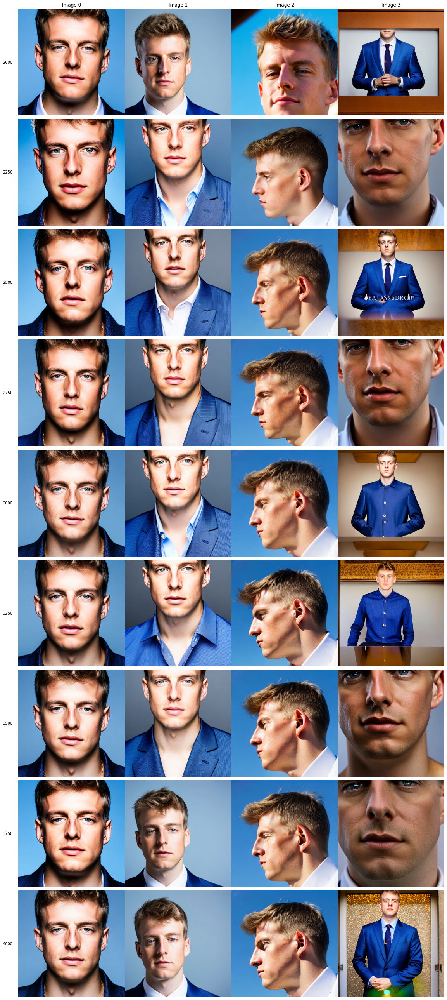

In [22]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

weights_folder = OUTPUT_DIR
folders = sorted([f for f in os.listdir(weights_folder) if f != "0"], key=lambda x: int(x))

row = len(folders)
col = len(os.listdir(os.path.join(weights_folder, folders[0], "samples")))
scale = 4
fig, axes = plt.subplots(row, col, figsize=(col*scale, row*scale), gridspec_kw={'hspace': 0, 'wspace': 0})

for i, folder in enumerate(folders):
    folder_path = os.path.join(weights_folder, folder)
    image_folder = os.path.join(folder_path, "samples")
    images = [f for f in os.listdir(image_folder)]
    for j, image in enumerate(images):
        if row == 1:
            currAxes = axes[j]
        else:
            currAxes = axes[i, j]
        if i == 0:
            currAxes.set_title(f"Image {j}")
        if j == 0:
            currAxes.text(-0.1, 0.5, folder, rotation=0, va='center', ha='center', transform=currAxes.transAxes)
        image_path = os.path.join(image_folder, image)
        img = mpimg.imread(image_path)
        currAxes.imshow(img, cmap='gray')
        currAxes.axis('off')
        
plt.tight_layout()
plt.savefig('grid.png', dpi=72)
wandb.log({"finetuning_results_overview": fig})

### Inference

In [23]:
# Util functions
from PIL import Image

if PRECISION == "fp16":
    fp16 = True
else:
    fp16 = False

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [ ]:
# Useful later when we actually use the depth2img model
DEPTH2IMG_DIR = "/content/inference/depth2img"
!makedir $DEPTH2IMG_DIR
for filename in glob.glob(os.path.join("/content/drive/MyDrive/StableDiffusion/pictures_depth2img", '*.*')):
    shutil.copy(filename, DEPTH2IMG_DIR)

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', adorable, attractive, hasselblad, candid street portrait']


  0%|          | 0/70 [00:00<?, ?it/s]

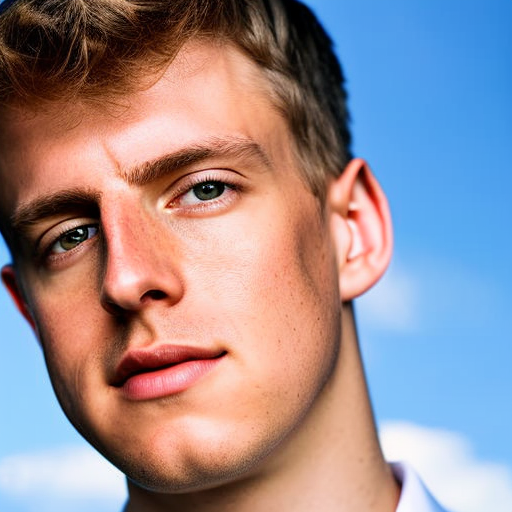

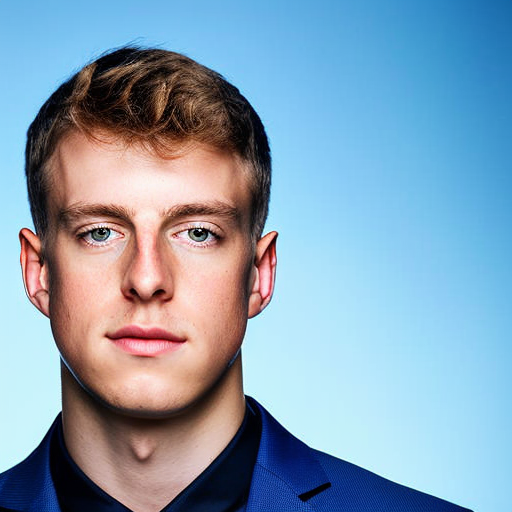

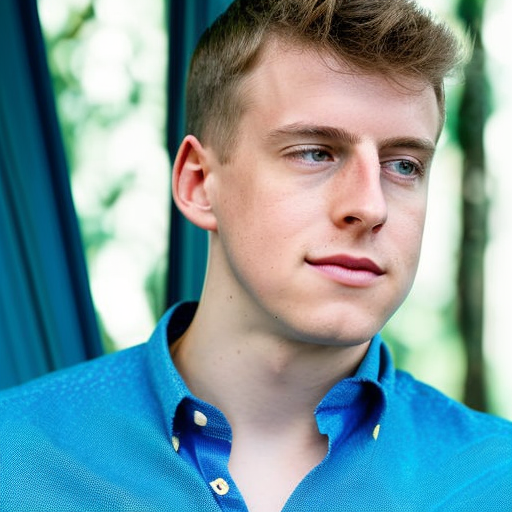

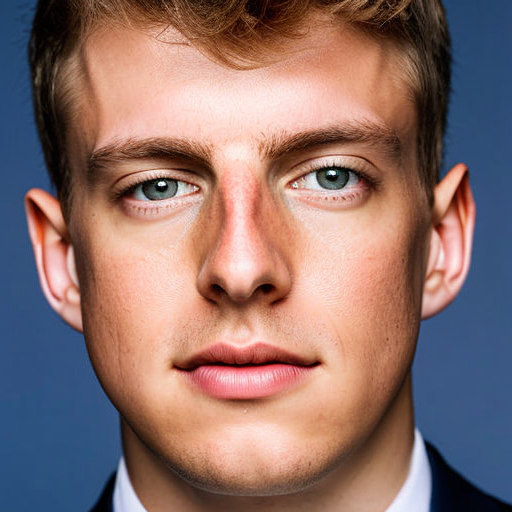

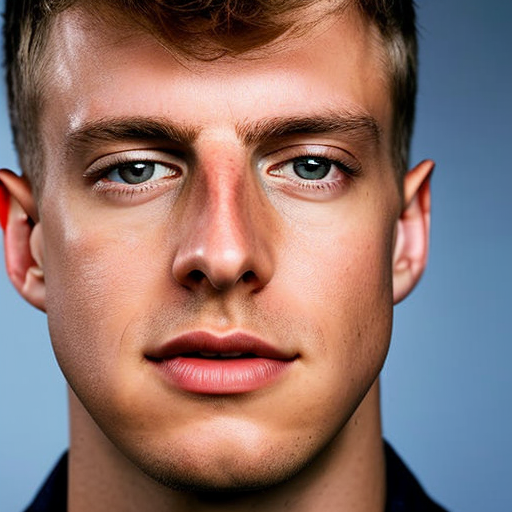

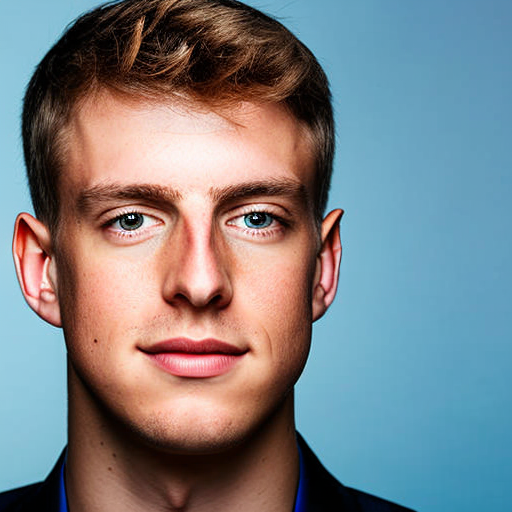

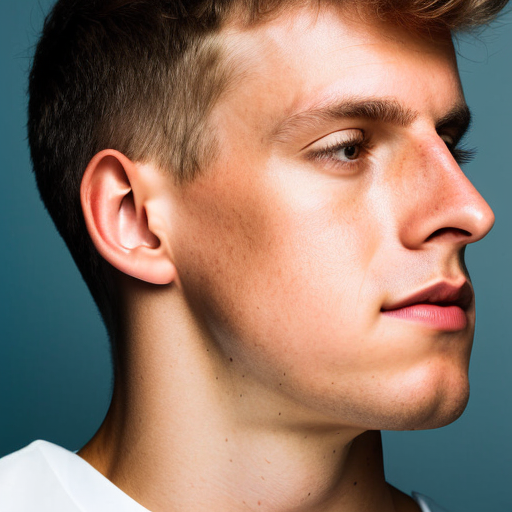

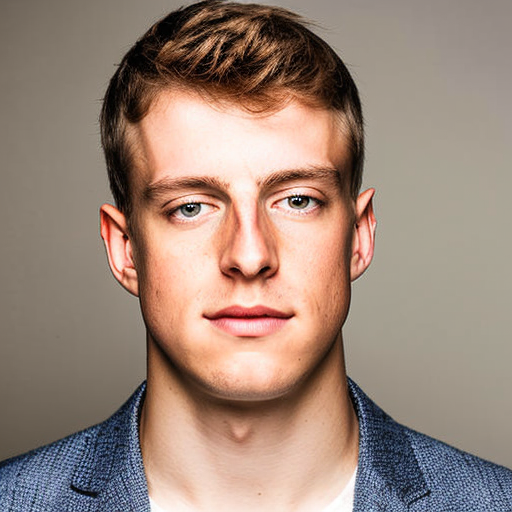

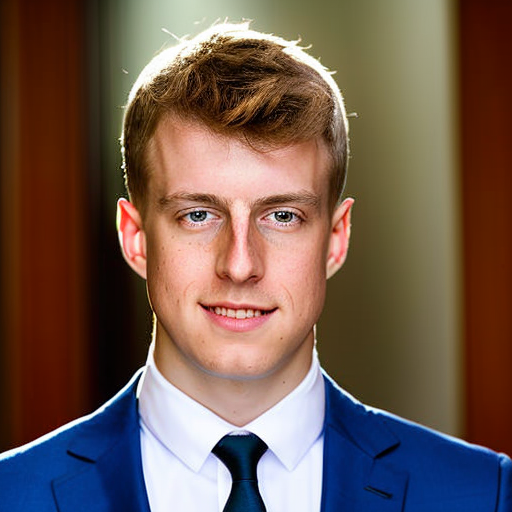

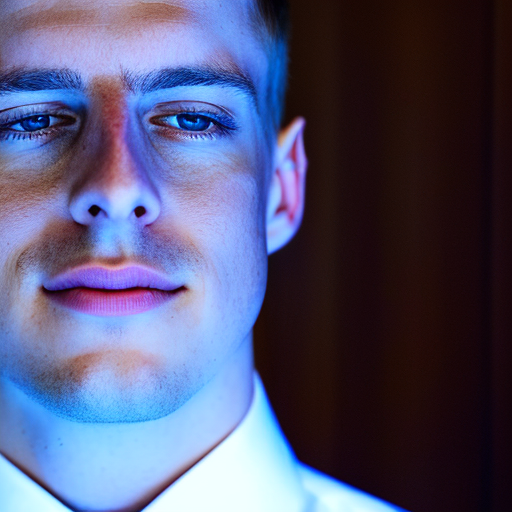

In [36]:
import torch
from torch import autocast
from diffusers import StableDiffusionPipeline, DDIMScheduler, EulerDiscreteScheduler
from IPython.display import display

model_path = WEIGHTS_DIR             # If you want to use previously trained model saved in gdrive, replace this with the full path of model in gdrive

scheduler_euler = EulerDiscreteScheduler.from_pretrained(MODEL_NAME, subfolder="scheduler")
scheduler_ddim = DDIMScheduler.from_pretrained(MODEL_NAME,subfolder="scheduler")

# First for Euler
if fp16:
  pipe = StableDiffusionPipeline.from_pretrained(model_path, scheduler=scheduler_euler, safety_checker=None, torch_dtype=torch.float16).to("cuda")
else:
  pipe = StableDiffusionPipeline.from_pretrained(model_path, scheduler=scheduler_euler, safety_checker=None, torch_dtype=torch.float32).to("cuda")

# Then for DDIM
g_cuda = torch.Generator(device='cuda').manual_seed(52362)


prompt = "photo of face and shoulders of jseidenfuss man in a blue suit from the front, front view, closeup, centered frame, symmetric, studio lighting, clear and realistic face, uhd faces, pexels, 85mm, casual pose, 35mm film roll photo, hard light, detailed skin texture, masterpiece, sharp focus, pretty, lovely, adorable, attractive, hasselblad, candid street portrait"
negative_prompt = "blender, ugly, multiple hands, bad anatomy, bad proportions, unrealistic, full body, cropped, lowres, poorly drawn face, out of frame, poorly drawn hands, double, blurred, disfigured, deformed, repetitive, black and white "
num_samples = 10
guidance_scale = 7
num_inference_steps = 70
height = 512
width = 512

  
images = pipe(
    prompt,
    height=height,
    width=width,
    negative_prompt=negative_prompt,
    num_images_per_prompt=num_samples,
    num_inference_steps=num_inference_steps,
    guidance_scale=guidance_scale,
    generator=g_cuda
).images
for image in images:
  display(image)

# Run over multiple parameters and generate a grid.
"""grids = []
for num_inference_steps in [50, 70, 90]:
  with autocast("cuda"), torch.inference_mode():
      images = pipe(
          prompt,
          height=height,
          width=width,
          negative_prompt=negative_prompt,
          num_images_per_prompt=num_samples,
          num_inference_steps=num_inference_steps,
          guidance_scale=guidance_scale,
          generator=g_cuda
      ).images
      grid = image_grid(images, 1, num_samples)
      grids.append(grid)
"""
del pipe

### Store model

In [43]:
artifact = wandb.Artifact('SD2.1_4000_finetuned_jseidenfuss', type='model')
artifact.add_dir(os.path.join(OUTPUT_DIR, "4000"))
run.log_artifact(artifact)

wandb: Adding directory to artifact (/content/stable_diffusion_weights/train/4000)... Done. 17.3s


In [44]:
run.finish()

In [45]:
exit()